<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/synthetic_data_generation_0205.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random

In [3]:
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)

# rule을 바꾼 concept drift...

In [46]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,2,2,3,3,4,4,5,5]
# 난수의 표준편차
stds =  [0.5,0.5,0.4,0.4,0.3,0.3,0.2,0.2,0.1,0.1]
# feature의 가중치
wss =   [0.5,0.4,0.3,0.2,0.1,0.1,0.1,0.3,0.1,0.1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    '''
    d1 = random.uniform(0.5, 10.0)
    d2 = random.uniform(0.0, 0.001)
    d3 = random.uniform(0.0, 0.003)
    w = random.uniform(0, 5)
    w_delta = random.uniform(-0.003, 0.001)
    '''
    for i in range(1000):
        for j in range(10):
            data_x[f'x{f}'].extend(np.random.normal(means[f],stds[f] + (i*0.005),10))
            weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,10))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.3,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

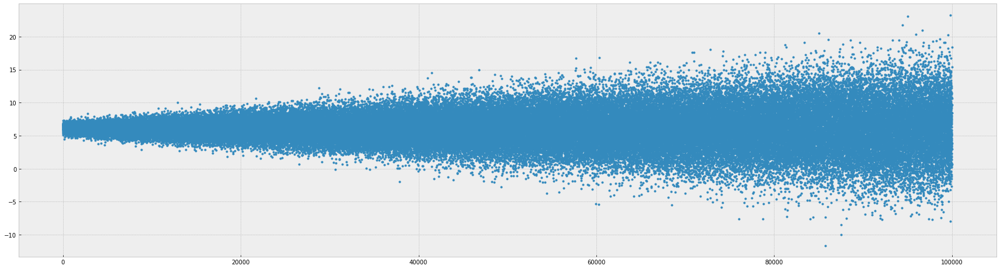

In [47]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [50]:
mn = np.mean(y)

In [51]:
dataset['y'] = [1 if i > mn else 0 for i in y]

In [52]:
# 여기서 rule을 중간에 바꾸어서 concept drift 유도한다.
dataset[50000:]['y'] = [1 if i > mn*2 else 0 for i in y[50000:]]

<ipython-input-52-bdae6cf8f8c9>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[50000:]['y'] = [1 if i > mn*2 else 0 for i in y[50000:]]


In [53]:
dataset

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,y
0,0.478420,2.039846,1.760227,2.748881,3.122279,3.759205,3.898760,4.043421,4.972478,5.070283,1
1,0.589572,0.292034,2.015673,2.190813,2.823849,3.164680,4.156987,4.333016,5.024415,4.956110,0
2,1.332573,1.007856,2.118904,2.165509,3.262793,2.745448,3.789326,3.965454,5.040896,5.171349,1
3,1.911313,1.576599,2.197231,1.575576,3.025821,3.295024,4.221939,4.004038,5.139957,4.975888,1
4,0.279208,1.943845,1.978129,1.520172,2.883163,2.603396,3.583924,4.113184,5.056238,4.905676,1
...,...,...,...,...,...,...,...,...,...,...,...
99995,-8.282254,-3.650516,9.887752,2.781855,5.817819,1.240264,11.225340,8.159708,13.549272,2.876952,0
99996,-9.134466,4.185247,0.571330,-3.094919,9.984344,-9.131649,7.865343,-0.297710,10.442596,8.119233,0
99997,7.669949,5.933099,3.126491,12.552089,-3.224228,11.420886,8.223264,10.057455,16.185122,13.882454,1
99998,-5.149069,3.734072,5.065817,-0.710472,2.070433,-1.079631,5.397520,2.992008,5.855398,3.520479,0


In [ ]:
dataset.to_csv('/content/drive/MyDrive/laos/synthetic_dataset_2_0115.csv')

In [54]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_recall_fscore_support

trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

base_score

(0.8131868131868132, 0.6981132075471698, 0.751269035532995, None)

In [55]:

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]   
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)
    
    #if ks_stat == minS:
    #    ks_stat = -ks_stat
    
    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [56]:
X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

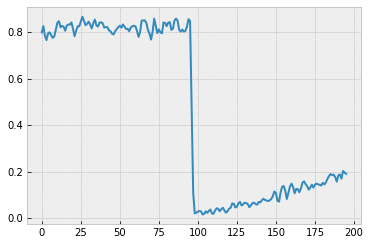

In [57]:
import math

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot()

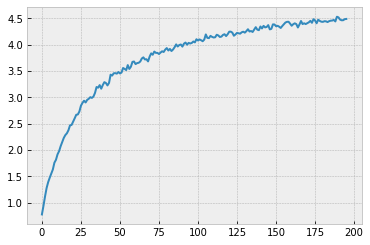

In [58]:
result_df['drift'].plot()

## 여기서, MI를 측정한다.

In [59]:

from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

  feature  importance
0      x0    0.099579
1      x1    0.090399
2      x2    0.035057
3      x3    0.015673
4      x6    0.012196
5      x9    0.012060
6      x4    0.000000
7      x5    0.000000
8      x7    0.000000
9      x8    0.000000


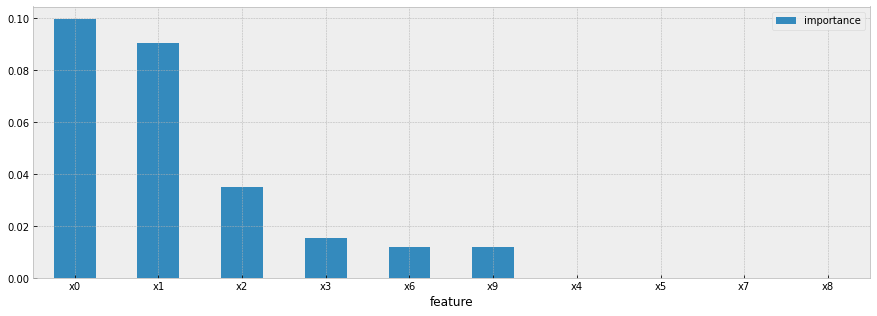

In [60]:
COLUMNS = ['x0','x1','x2','x3','x4','x5','x6','x7','x8','x9']
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))

imp_df3 = pd.DataFrame({'feature':mi_scores.keys()[:10],'importance':mi_scores.values[:10]})
print(imp_df3)
imp_df3.plot.bar(x='feature',rot=0,figsize=(15,5))

In [61]:
import math

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)


196/196 f1:0.1899

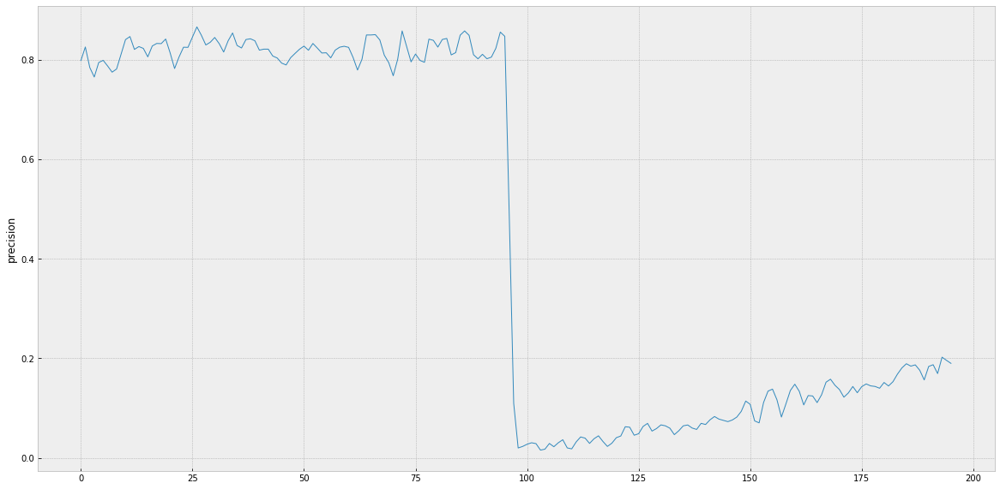

In [62]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(20,10))

[]

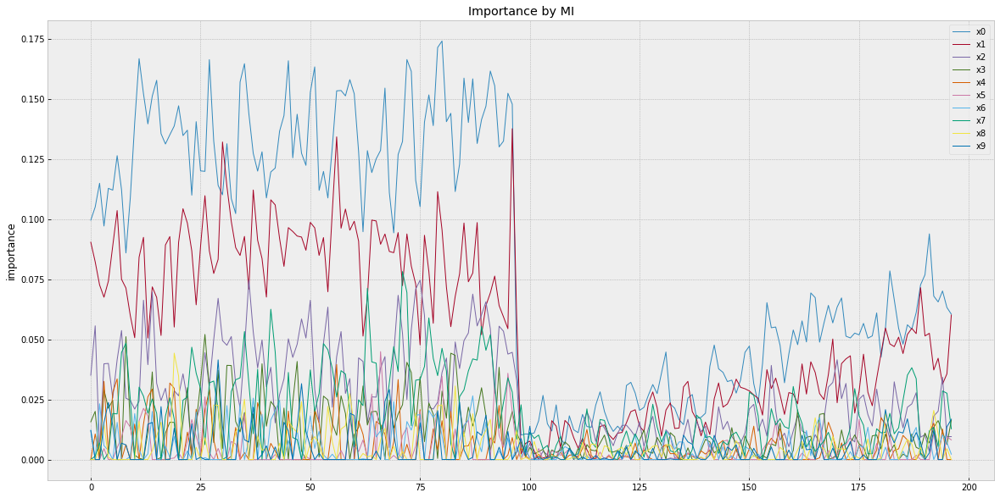

In [63]:
ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(20,10),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

[]

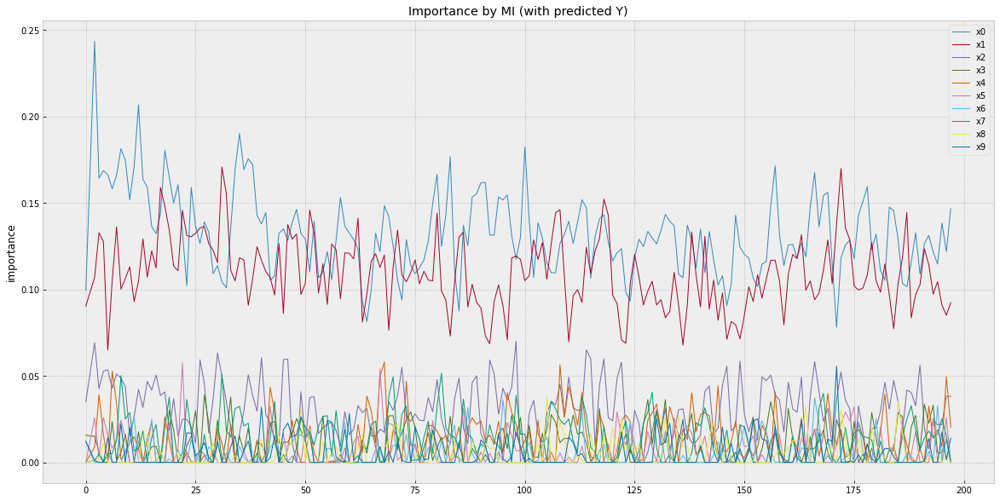

In [65]:
ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(20,10),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

### 결론

rule을 바꾼 concept drift는 MI에서 변화를 감지 할 수 없다... 당연한거 아님!!!

# weight를 흔든 concept drift

In [96]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,2,2,3,3,4,4,5,5]
# 난수의 표준편차
stds =  [0.5,0.5,0.4,0.4,0.3,0.3,0.2,0.2,0.1,0.1]
# feature의 가중치
wss1 =   [0.1,0.1,0.1,0.1,0.4,0.5,0.3,0.1,0.1,0.4]
wss2 =   [0.5,0.4,0.3,0.2,0.1,0.1,0.1,0.3,0.1,0.1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    '''
    d1 = random.uniform(0.5, 10.0)
    d2 = random.uniform(0.0, 0.001)
    d3 = random.uniform(0.0, 0.003)
    w = random.uniform(0, 5)
    w_delta = random.uniform(-0.003, 0.001)
    '''
    for i in range(1000):
        for j in range(10):
            data_x[f'x{f}'].extend(np.random.normal(means[f],stds[f] + (i*0.005),10))
            #weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            if i > 500:
                weight[f'w{f}'].extend(wss2[f]+ np.random.normal(0.0,0.01,10))
            else:
                weight[f'w{f}'].extend(wss1[f]+ np.random.normal(0.0,0.01,10))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.3,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

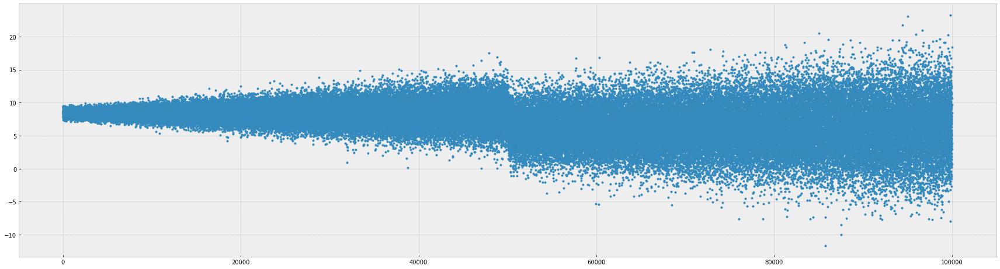

In [97]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [98]:
mn = np.mean(y[0:1000])
mn

8.397983487699962

In [99]:
dataset['y'] = [1 if i > mn else 0 for i in y]

In [100]:
dataset

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,y
0,0.478420,2.039846,1.760227,2.748881,3.122279,3.759205,3.898760,4.043421,4.972478,5.070283,1
1,0.589572,0.292034,2.015673,2.190813,2.823849,3.164680,4.156987,4.333016,5.024415,4.956110,1
2,1.332573,1.007856,2.118904,2.165509,3.262793,2.745448,3.789326,3.965454,5.040896,5.171349,1
3,1.911313,1.576599,2.197231,1.575576,3.025821,3.295024,4.221939,4.004038,5.139957,4.975888,1
4,0.279208,1.943845,1.978129,1.520172,2.883163,2.603396,3.583924,4.113184,5.056238,4.905676,0
...,...,...,...,...,...,...,...,...,...,...,...
99995,-8.282254,-3.650516,9.887752,2.781855,5.817819,1.240264,11.225340,8.159708,13.549272,2.876952,0
99996,-9.134466,4.185247,0.571330,-3.094919,9.984344,-9.131649,7.865343,-0.297710,10.442596,8.119233,0
99997,7.669949,5.933099,3.126491,12.552089,-3.224228,11.420886,8.223264,10.057455,16.185122,13.882454,1
99998,-5.149069,3.734072,5.065817,-0.710472,2.070433,-1.079631,5.397520,2.992008,5.855398,3.520479,0


In [101]:
trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values
base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')
base_score

(0.6902654867256637, 0.7428571428571429, 0.7155963302752294, None)

In [102]:
X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

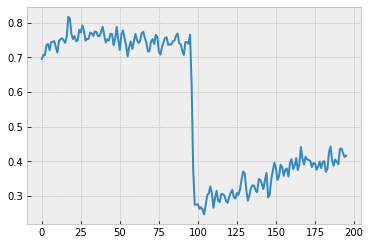

In [103]:
import math

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot()

In [105]:
import math

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)


196/196 f1:0.4160

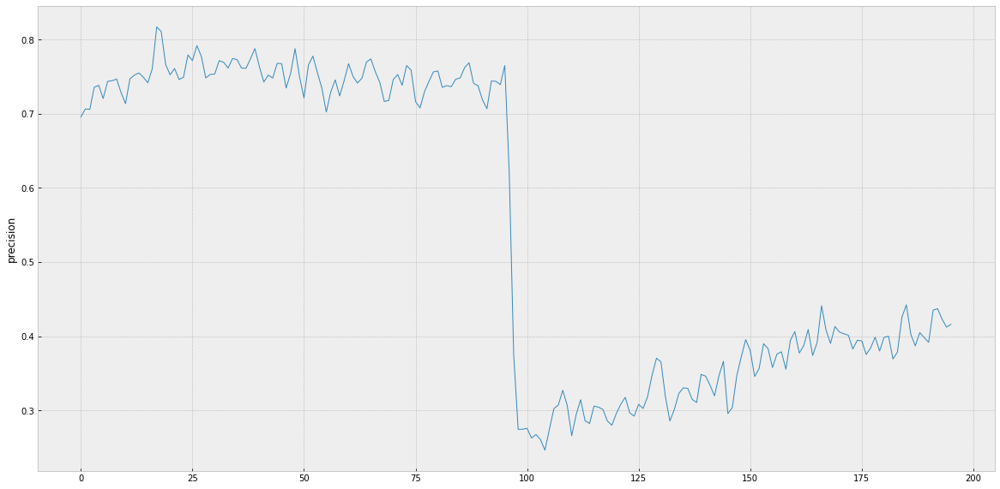

In [106]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(20,10))

[]

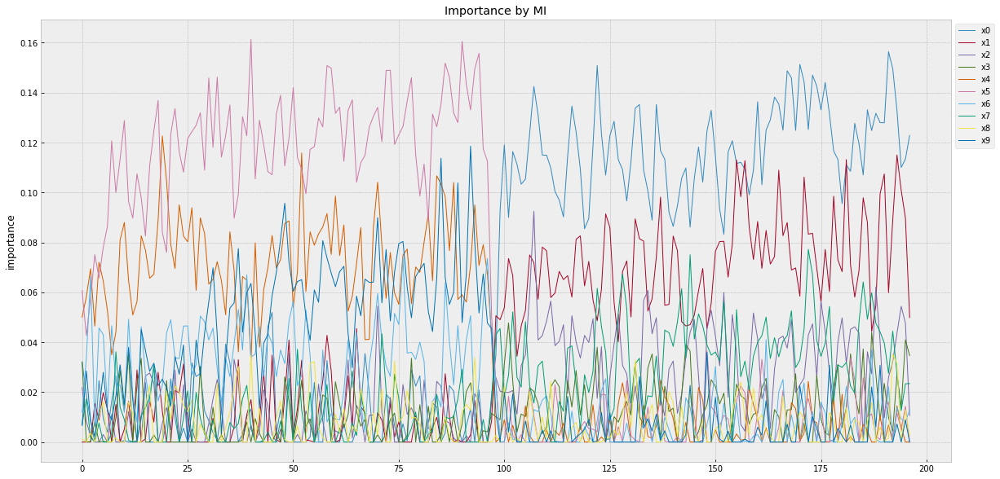

In [107]:
ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(20,10),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

[]

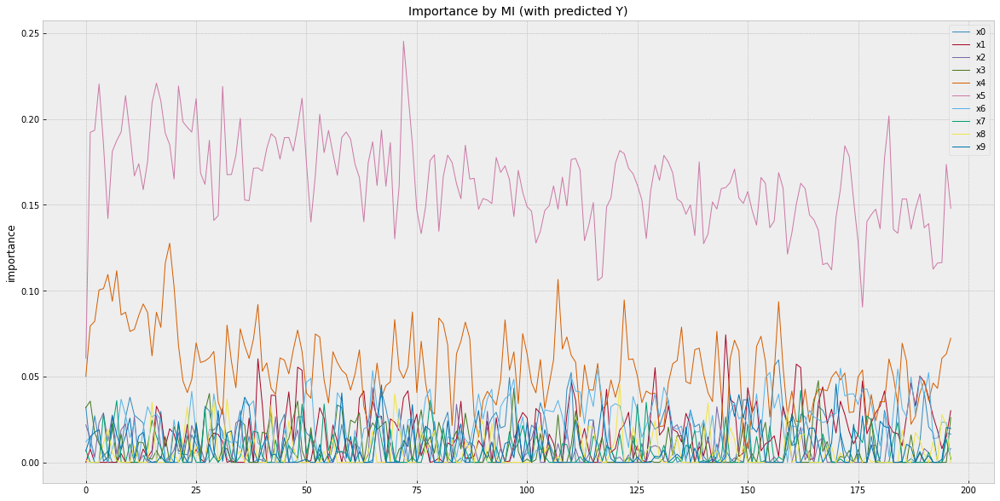

In [108]:
ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(20,10),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

#### 급격한 drift에 의한 concept drift

##### drift가 없는 경우, 끝까지 변화 없다.

In [149]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [5,4,3,2,1,1,1,1,1,1]
# feature의 가중치
wss =   [5,4,3,2,1,1,1,1,1,1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            data_x[f'x{f}'].extend(np.random.normal(means[f],stds1[f]*0.1,10))
            weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,100))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.05,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

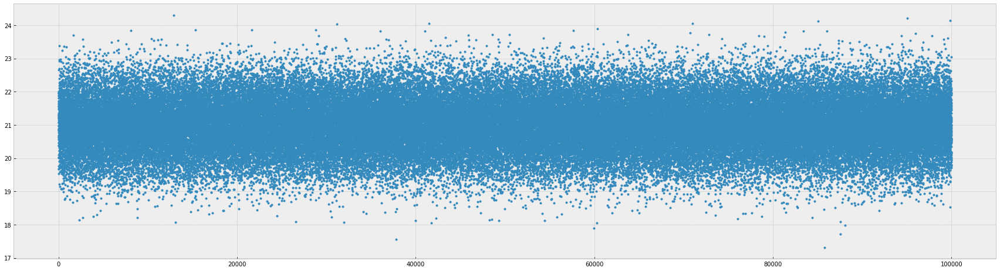

In [150]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [151]:
mn = np.mean(y[0:1000])
mn

21.007586519283517

In [152]:
dataset['y'] = [1 if i > mn else 0 for i in y]

In [153]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_recall_fscore_support

trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

base_score

(0.9333333333333333, 0.8921568627450981, 0.9122807017543859, None)

In [154]:
X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

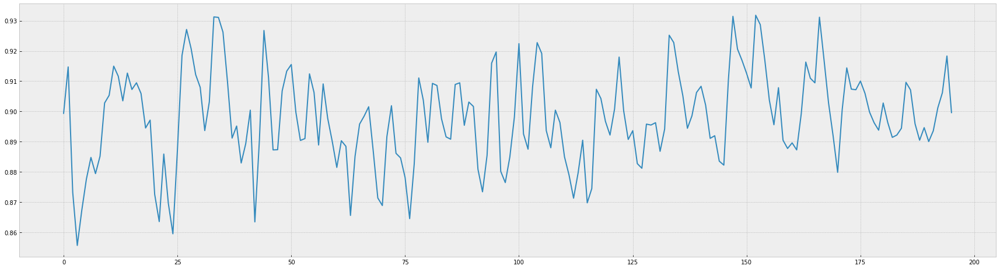

In [158]:
import math

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))

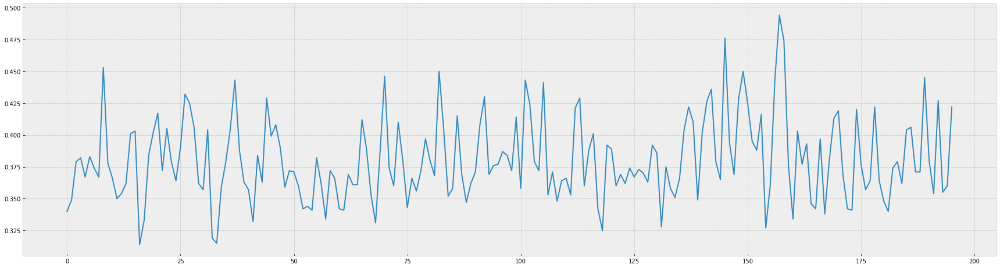

In [156]:
result_df['drift'].plot(figsize=(30,8))

In [159]:
import math

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)


         x0        x1        x2        x3       x4   x5        x6   x7  \
0  0.135112  0.107205  0.034631  0.023061  0.00838  0.0  0.016655  0.0   

         x8        x9  
0  0.031466  0.011645  
196/196 f1:0.8996

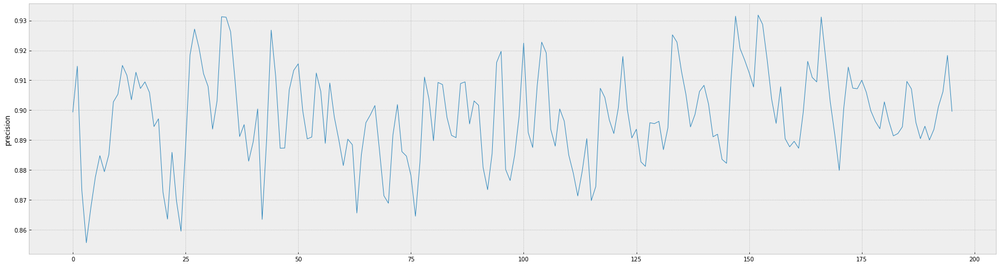

In [161]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

[]

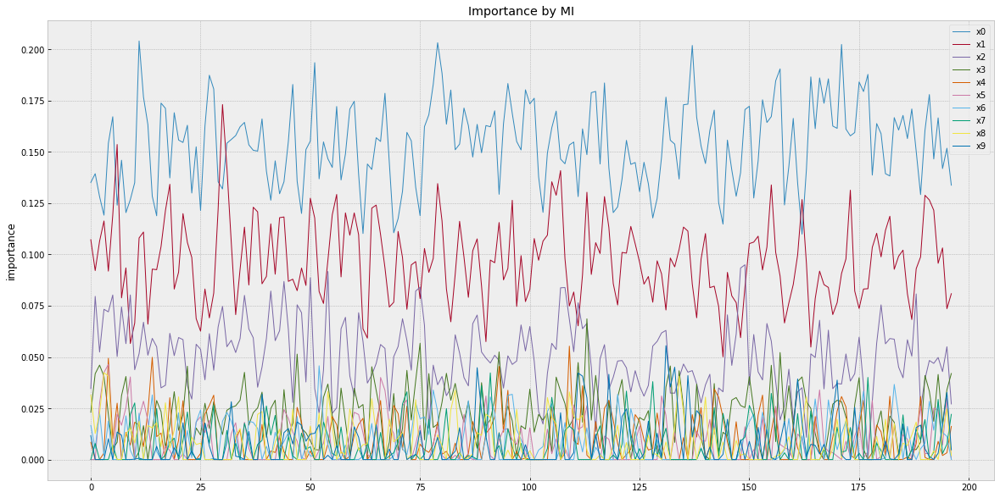

In [162]:
ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(20,10),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

[]

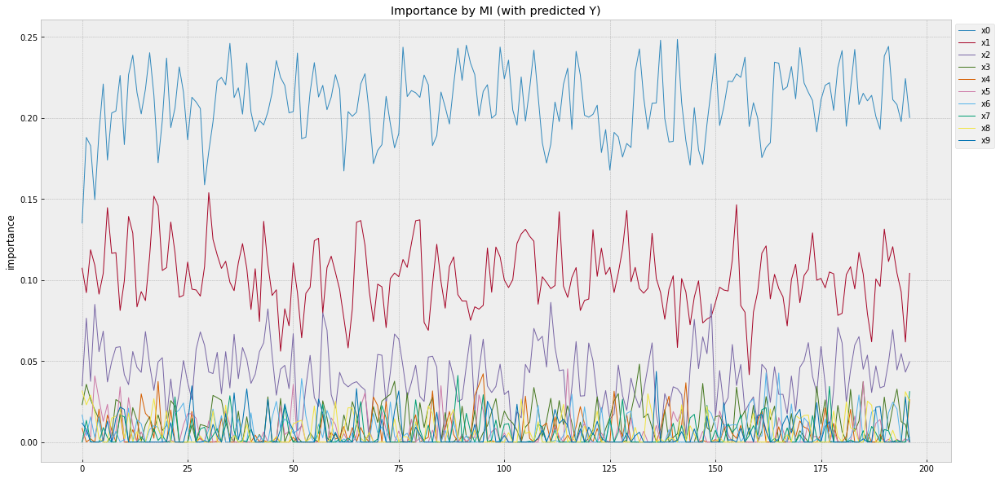

In [163]:
ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(20,10),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

#### drift 증가하면서 성능의 변화 없는 경우!

그럴수도 있다. drift의 증가 = 성능 낮아짐! 이라고 할 수는 없다. <br>
이때, PMI는 변화가 없다!!!!!!!!!!!!!!

In [436]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [5,4,3,2,1,1,1,1,1,1]
# feature의 가중치
wss =   [5,4,3,2,1,1,1,1,1,1]
# drift가 발생하는 feature
drift_feature = [1,1,-1,1,1,0,-1,1,0,1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            data_x[f'x{f}'].extend(np.random.normal(means[f],stds1[f]*0.1 + (i*0.0001),10))
            #data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))
            weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,100))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

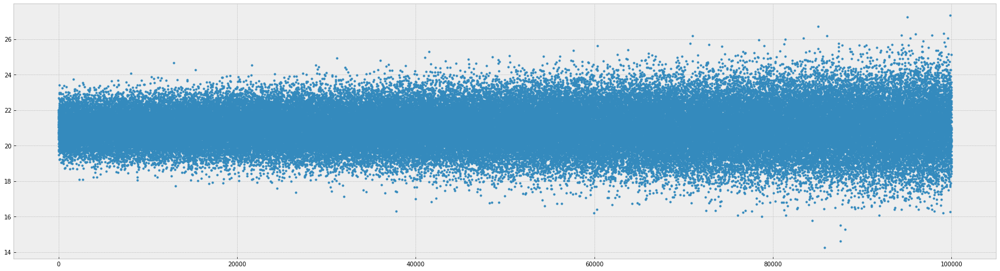

In [437]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [438]:
mn = np.mean(y[0:1000])
mn

21.00842317843594

In [439]:
dataset['y'] = [1 if i > mn else 0 for i in y]

In [440]:
trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

base_score

(0.9154228855721394, 0.9019607843137255, 0.9086419753086419, None)

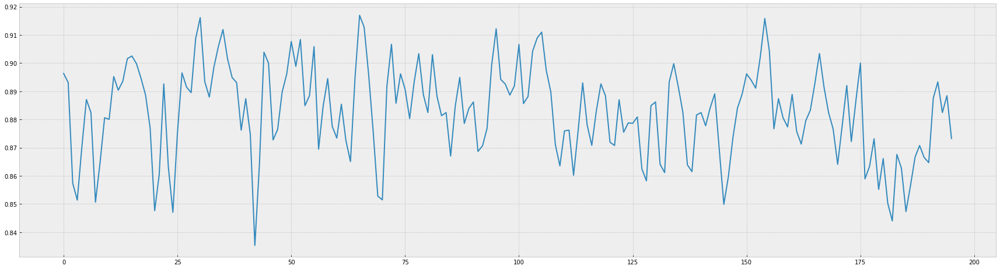

In [441]:
X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))

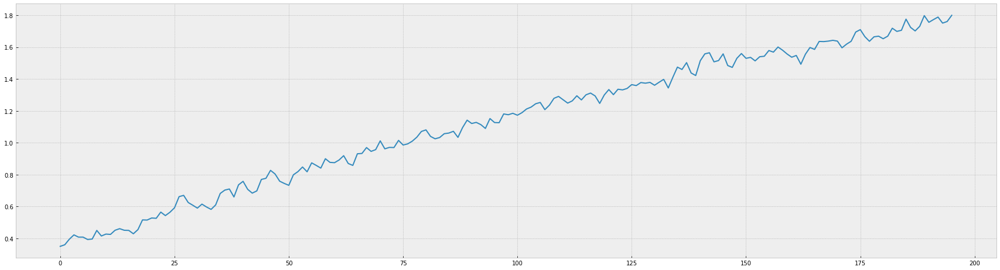

In [442]:
result_df['drift'].plot(figsize=(30,8))

In [443]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

         x0        x1        x2       x3        x4   x5        x6   x7  \
0  0.140526  0.106718  0.040935  0.00785  0.015088  0.0  0.013804  0.0   

         x8        x9  
0  0.013673  0.015121  
196/196 f1:0.8733

[]

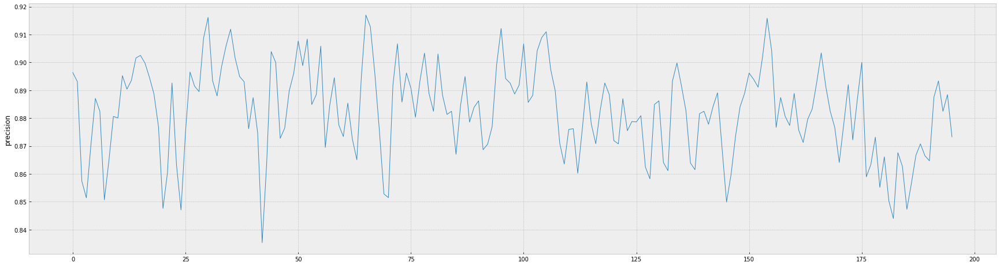

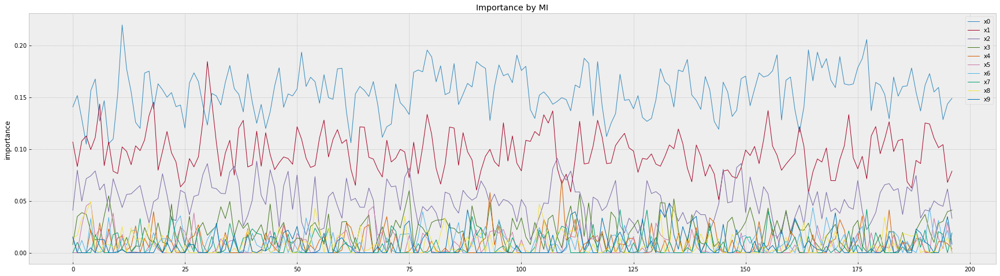

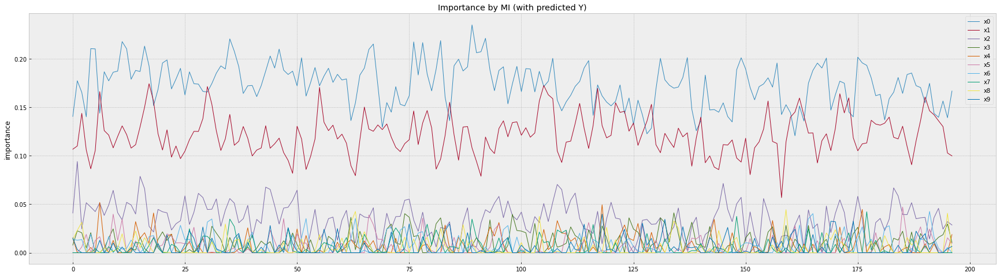

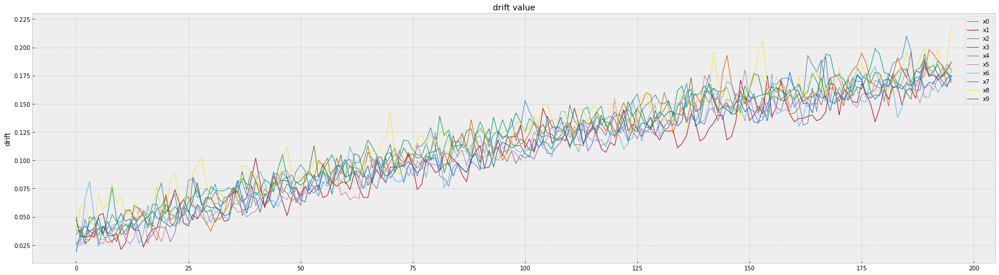

In [444]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

#### drift 증가하면서 성능이 낮아지는 경우!

PMI에도 반영되어 나타난다.

In [317]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [5,4,3,2,1,1,1,1,1,1]
# feature의 가중치
wss =   [5,4,3,2,1,1,1,1,1,1]
# drift가 발생하는 feature
drift_feature = [1,1,-1,1,1,0,-1,1,0,1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            #data_x[f'x{f}'].extend(np.random.normal(means[f]- (i*0.001),stds1[f]*0.1 + (i*0.001),10))
            data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))
            weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,100))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

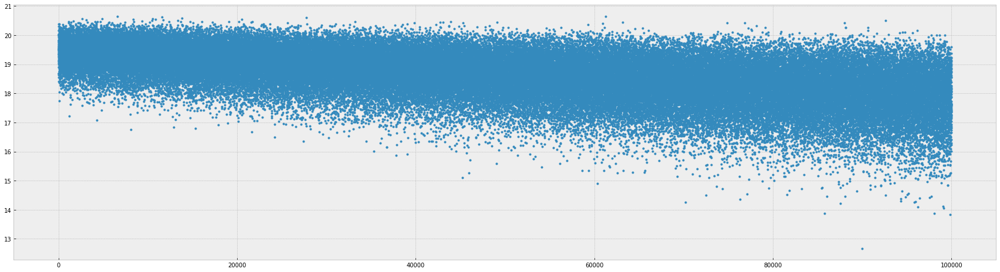

In [318]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [319]:
mn = np.mean(y[0:1000])
mn

19.406379713350987

In [320]:
dataset['y'] = [1 if i > mn else 0 for i in y]

In [321]:
trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

base_score


(0.8803827751196173, 0.9387755102040817, 0.908641975308642, None)

In [322]:
X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

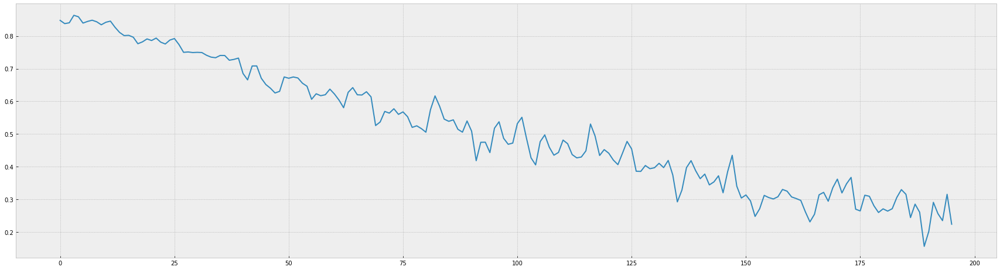

In [323]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))

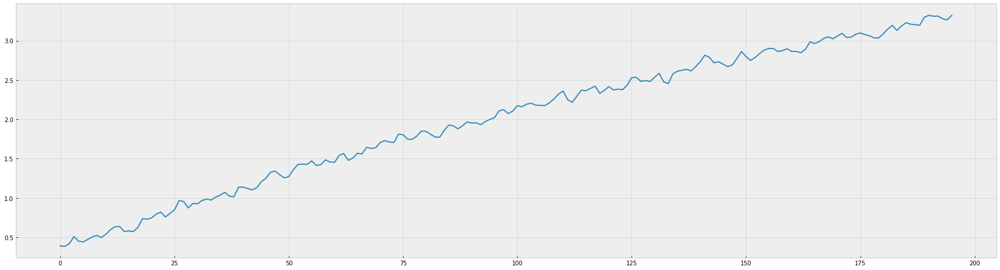

In [324]:
result_df['drift'].plot(figsize=(30,8))

In [329]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

         x0        x1        x2        x3   x4        x5        x6   x7   x8  \
0  0.130371  0.102086  0.037456  0.044098  0.0  0.030005  0.017698  0.0  0.0   

    x9  
0  0.0  
196/196 f1:0.2243

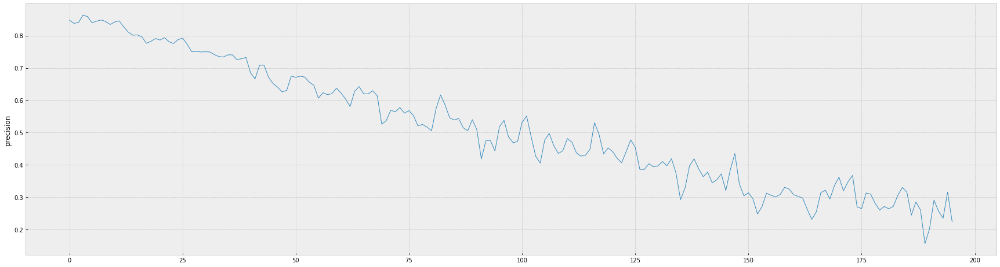

In [326]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

[]

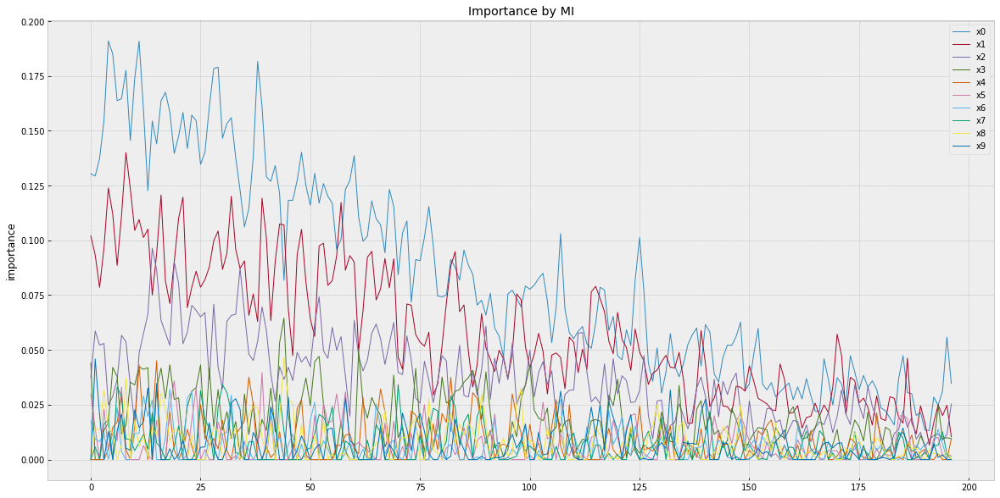

In [327]:
ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(20,10),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

[]

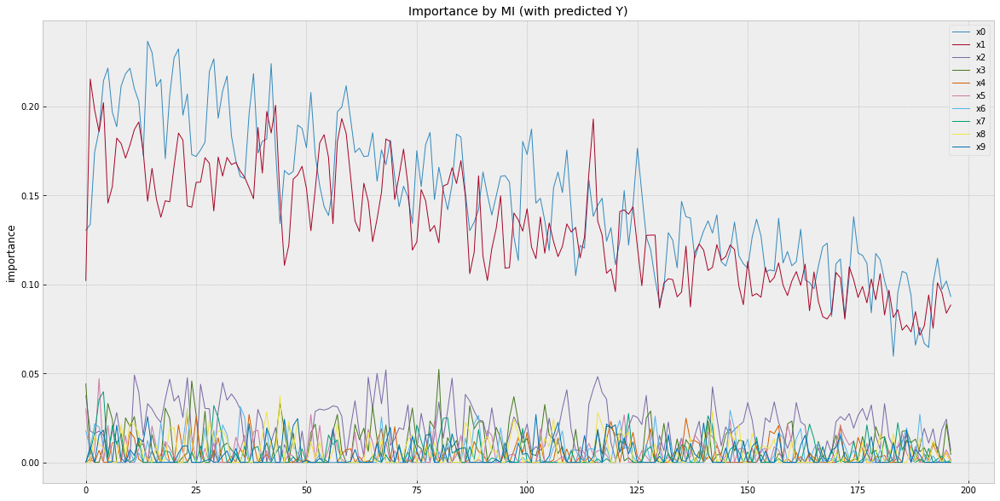

In [328]:
ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(20,10),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

[]

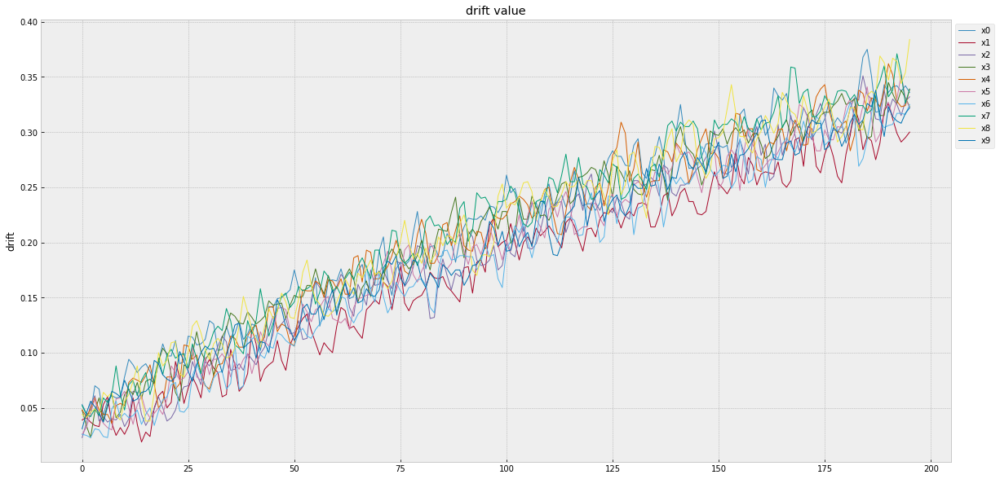

In [330]:
tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(20,10),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

##### drift가 중간에 급격히 증가하는 경우? 

drift에 의해 성능이 낮아지는 경우, PMI에 반영된다.<br>
PMI가 낮아진다. (변화는 있으나... 항상 낮아지는 것은 아닐 듯...)<br>


In [445]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [2,4,3,2,1,3,1,2,4,1]
# feature의 가중치
wss =   [5,4,3,2,1,1,1,1,1,1]
# drift가 발생하는 feature
drift_feature = [1,1,-1,1,1,0,-1,1,0,1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            #data_x[f'x{f}'].extend(np.random.normal(means[f]- (i*0.001),stds1[f]*0.1 + (i*0.001),10))
            if i < 500:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))         
            else:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0002),10)))
            weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,100))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

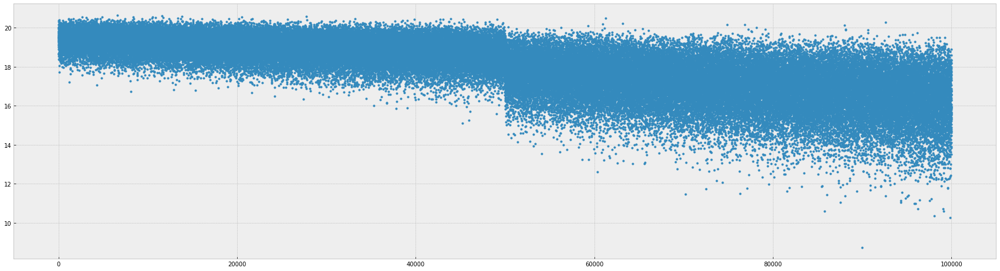

In [446]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

In [447]:
mn = np.mean(y[0:1000])
mn


19.406379713350987

In [448]:
dataset['y'] = [1 if i > mn else 0 for i in y]

In [449]:
trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

base_score

(0.8803827751196173, 0.9387755102040817, 0.908641975308642, None)

In [450]:
X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


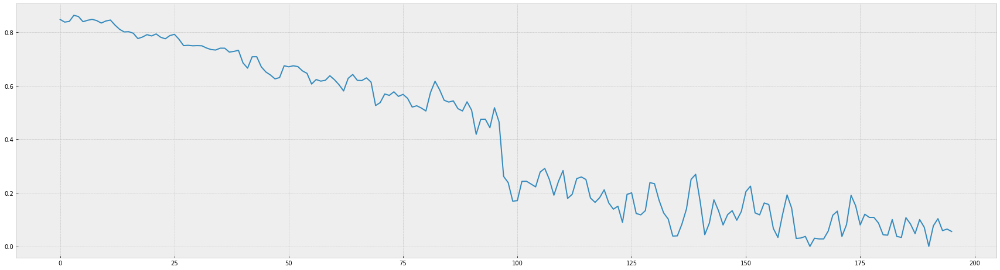

In [451]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))

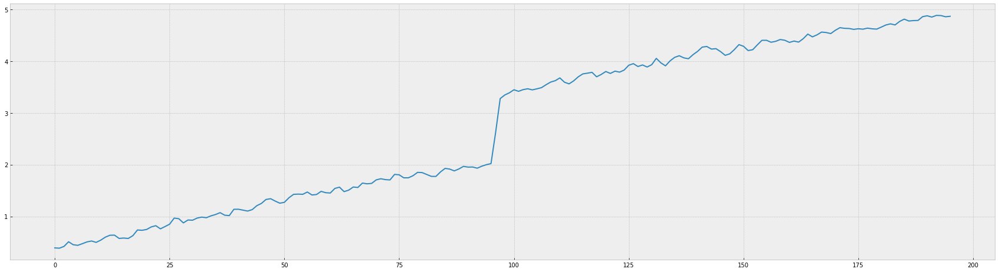

In [452]:
result_df['drift'].plot(figsize=(30,8))

In [453]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

         x0        x1        x2        x3   x4        x5        x6   x7   x8  \
0  0.130371  0.102086  0.037456  0.044098  0.0  0.030005  0.017698  0.0  0.0   

    x9  
0  0.0  
165/196 f1:0.0000

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


191/196 f1:0.0000

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


196/196 f1:0.0556

[]

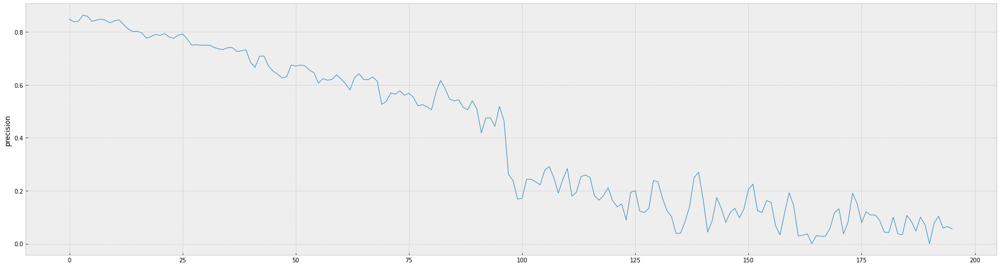

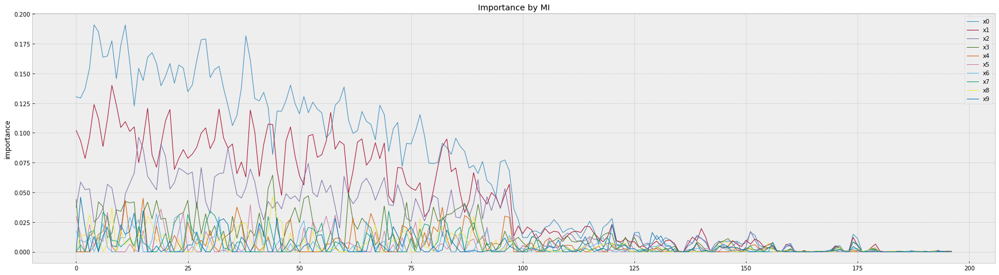

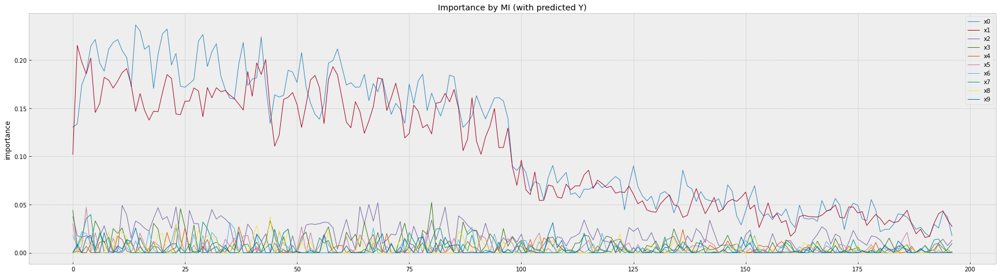

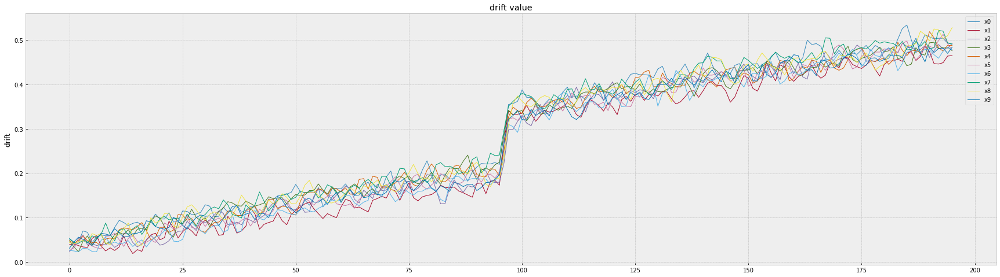

In [454]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()


#### importance 변화와 drift가 동시에 일어나는 경우, real world에서 통상적인 상황으로 볼수 있다. (???) 


importance 변화는 갑작스런 변화... <br>
importance 변화의 변화는 Predicted MI (PMI)와 drift에서 전혀 감지하지 못한다.

In [468]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
stds2 =  [2,5,3,0,1,3,1,2,0,1]
# feature의 가중치
wss1 =   [5,4,3,2,1,1,1,1,1,1]
wss2 =   [1,1,1,1,1,1,2,3,4,5]
# drift가 발생하는 feature
drift_feature = [1,1,-1,1,1,0,-1,1,0,1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            #data_x[f'x{f}'].extend(np.random.normal(means[f]- (i*0.001),stds1[f]*0.1 + (i*0.001),10))
            if i < 500:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))
                #weight[f'w{f}'].extend(wss1[f]+ np.random.normal(0.0,0.01,10))   
            else:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds2[f]*0.1 + (i*0.0001),10)))
                #weight[f'w{f}'].extend(wss2[f]+ np.random.normal(0.0,0.01,10))

            if i < 300:
                #data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))
                weight[f'w{f}'].extend(wss1[f]+ np.random.normal(0.0,0.01,10))   
            else:
                #data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds2[f]*0.1 + (i*0.0001),10)))
                weight[f'w{f}'].extend(wss2[f]+ np.random.normal(0.0,0.01,10))                
            #weight[f'w{f}'].extend(wss[f]+ np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,100))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

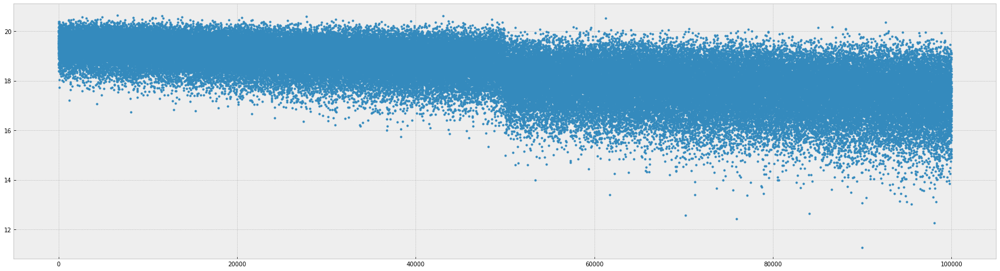

In [469]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

y mean: 19.406379713350987
default performance: (0.8803827751196173, 0.9387755102040817, 0.908641975308642, None)


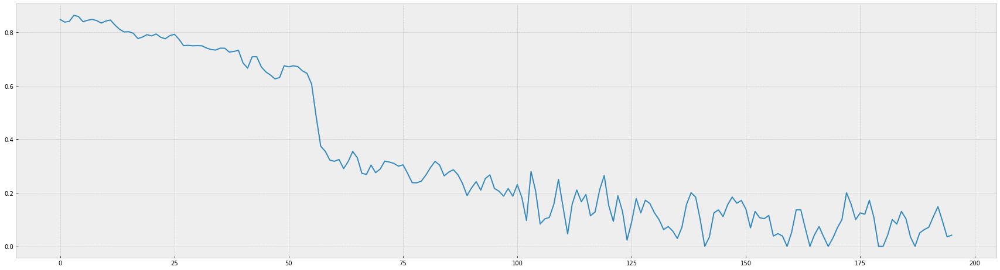

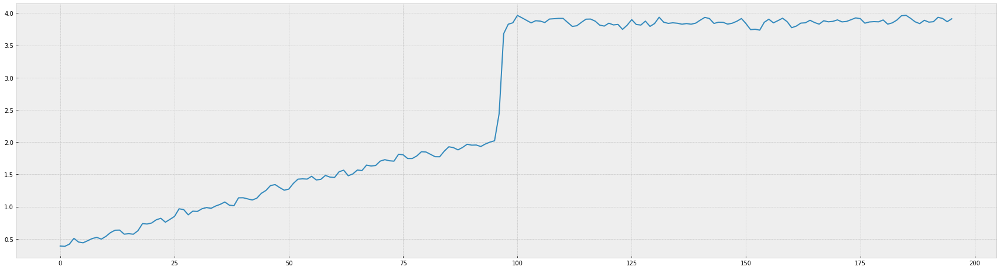

In [470]:
mn = np.mean(y[0:1000])
print("y mean:",mn)
dataset['y'] = [1 if i > mn else 0 for i in y]


trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

print("default performance:",base_score)

X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))
plt.show()
result_df['drift'].plot(figsize=(30,8))
plt.show()

In [471]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

         x0        x1        x2        x3   x4        x5        x6   x7   x8  \
0  0.130371  0.102086  0.037456  0.044098  0.0  0.030005  0.017698  0.0  0.0   

    x9  
0  0.0  
196/196 f1:0.0417

[]

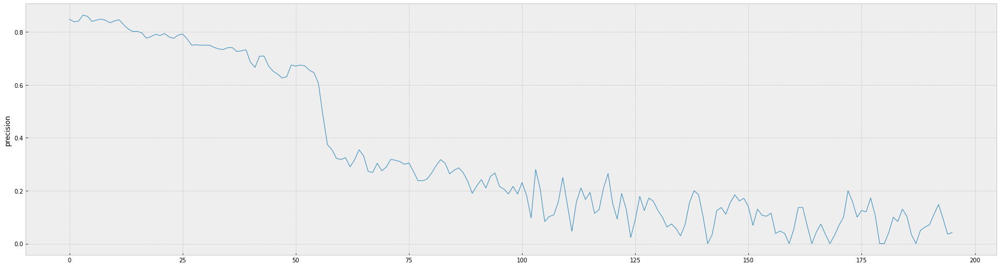

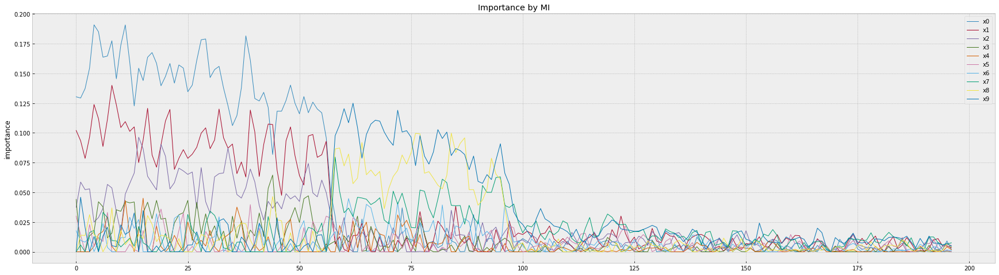

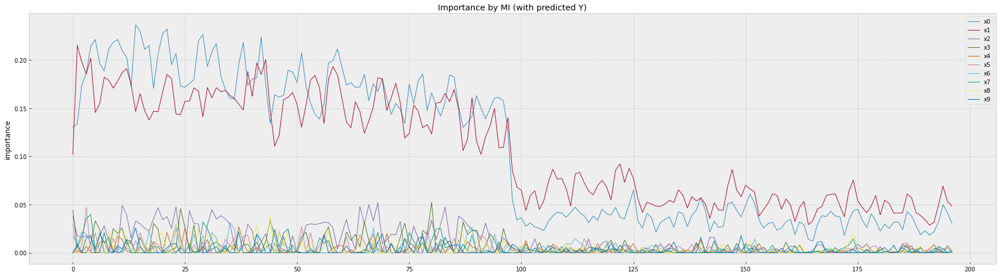

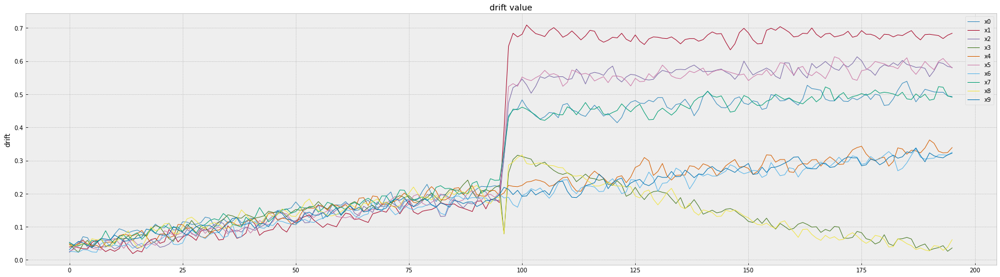

In [472]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()


#### importance 변화와 drift가 동시에 일어나는 경우, real world에서 통상적인 상황으로 볼수 있다. (???) 


importance 점진적인 변화... <br>
importance 변화의 변화는 Predicted MI (PMI)와 drift에서 전혀 감지하지 못한다.<br>
하지만, drift의 급진적 변화에 따른 성능 요동 이후, importance의 변화 양상은 PMI에 반영되었다???<br>
이는, drift의 급진적 변화가 importance를 반영한다는 의미????


In [500]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [1,1,1,1,1,1,1,1,1,1]
stds2 =  [2,5,3,0,1,3,1,2,0,1]
# feature의 가중치
wss1 =   [5,4,3,2,1,1,1,1,1,1]
wss2 =   [4,5,2,3,1,1,1,1,1,1]
# drift가 발생하는 feature
drift_feature = [1,1,-1,1,1,0,-1,1,0,1]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            #data_x[f'x{f}'].extend(np.random.normal(means[f]- (i*0.001),stds1[f]*0.1 ,10))
            
            if i < 500:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))
                #weight[f'w{f}'].extend(wss1[f]+ np.random.normal(0.0,0.01,10))   
            else:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds2[f]*0.1 + (i*0.0001),10)))
                #weight[f'w{f}'].extend(wss2[f]+ np.random.normal(0.0,0.01,10))
            
            ww = i/1000
            weight[f'w{f}'].extend((wss1[f]*(1-ww) + wss2[f]*ww) + np.random.normal(0.0,0.01,10))
            #weight[f'w{f}'].extend(w + np.random.normal(0.0,0.01,100))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

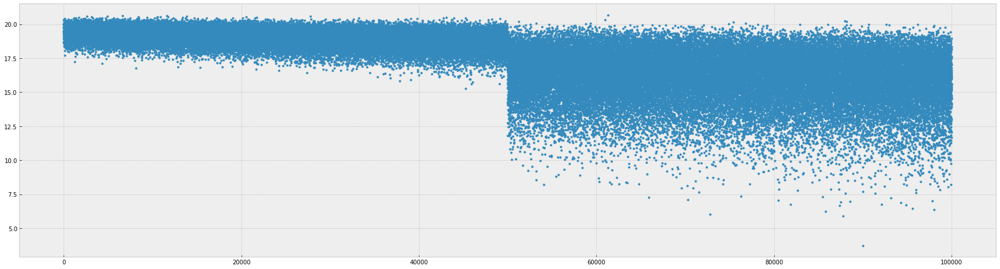

In [501]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

y mean: 19.40636534407618
default performance: (0.8755980861244019, 0.9384615384615385, 0.905940594059406, None)


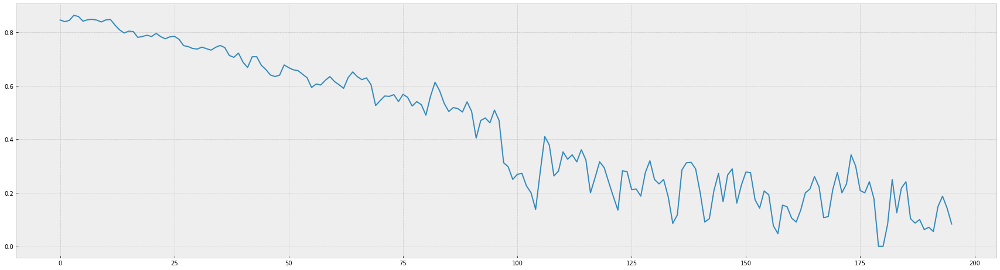

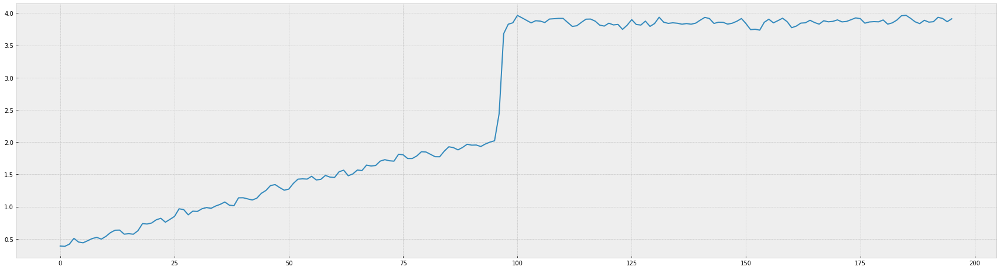

In [502]:
mn = np.mean(y[0:1000])
print("y mean:",mn)
dataset['y'] = [1 if i > mn else 0 for i in y]


trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

print("default performance:",base_score)

X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))
plt.show()
result_df['drift'].plot(figsize=(30,8))
plt.show()

In [503]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

         x0        x1        x2        x3   x4        x5        x6   x7   x8  \
0  0.130371  0.102086  0.037456  0.044098  0.0  0.030005  0.017698  0.0  0.0   

    x9  
0  0.0  
196/196 f1:0.0833

[]

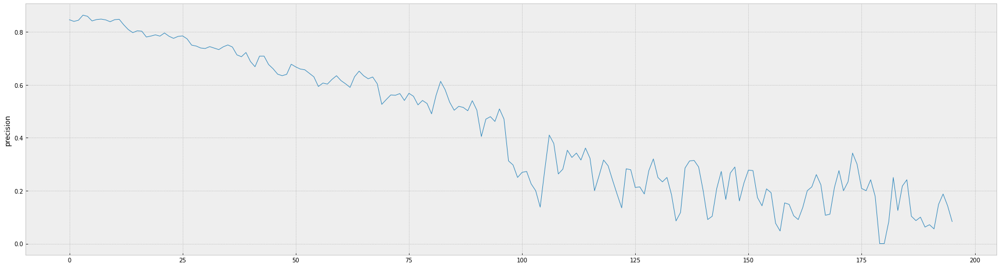

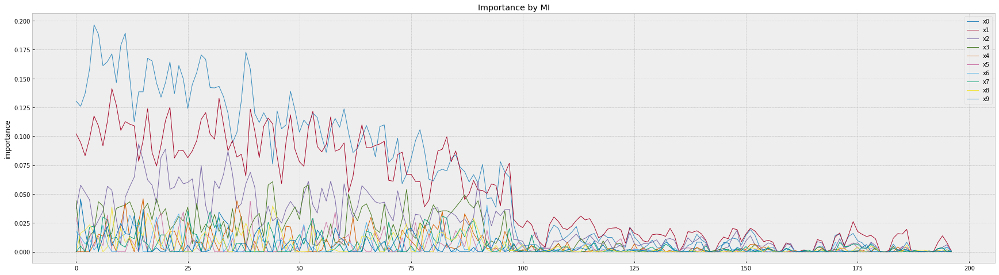

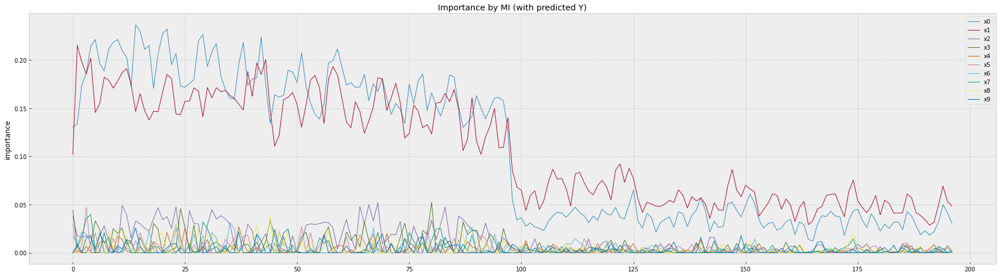

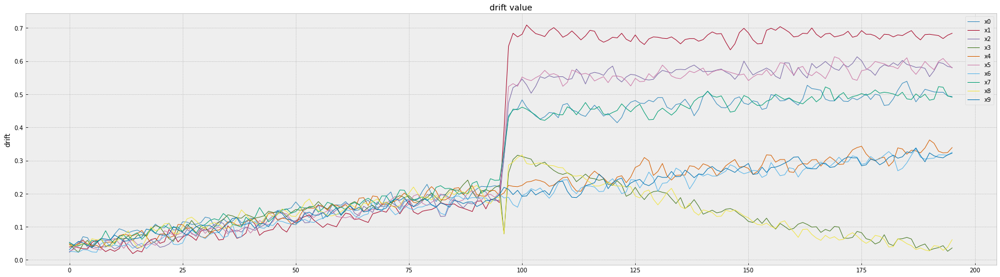

In [504]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()


#### 특정 feature에 한하여 drift가 일어나는 경우, 

feature의 importance에 대해서, drift의 세기에 따라, 상대적으로 drift가 큰 feature가 PMI가 증가하는 (높게) 나타난다.--?? <br>
아래 실험에서 x1은 importance 5, x2는 importance 4, x1은 drift가 있고, x2는 없었는데, x1은 PMI가 증가하고, x2는 낮아 졌다, 이는 drift가 없는 x2를 밟고 x1의 PMI가 증가한 현상으로 보인다. <br>
즉, 상대적 drift에 따라 PMI가 성능 상황과 괸계없이 증가 하는 것으로 보일 수 있다. 

In [509]:
import random

seed_everything(seed=49)

data_x = {}
weight = {}
errors = []
# 난수의 평균
means = [1,1,1,1,1,1,1,1,1,1]
# 난수의 표준편차
stds1 =  [1,1,1,1,1,1,1,1,1,1]
#stds2 =  [1,1,1,1,1,1,1,1,1,1]
stds2 =  [2,5,3,0,1,3,1,2,0,1]
# feature의 가중치
wss1 =   [5,4,3,2,1,1,1,1,1,1]
wss2 =   [4,5,2,3,1,1,1,1,1,1]
# drift가 발생하는 feature
drift_feature = [1,0,0,1,0,0,0,0,0,0]
for f in range(10):
    data_x[f'x{f}'] = []
    weight[f'w{f}'] = []
    for i in range(1000):
        for j in range(10):
            if drift_feature[f] == 1:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1 + (i*0.0001),10)))
            else:
                data_x[f'x{f}'].extend(means[f] - np.abs(np.random.normal(0,stds1[f]*0.1,10)))
            
            ww = i/1000
            #weight[f'w{f}'].extend((wss1[f]*(1-ww) + wss2[f]*ww) + np.random.normal(0.0,0.01,10))
            weight[f'w{f}'].extend(wss1[f]+ np.random.normal(0.0,0.01,10))

for i in range(10000):        
    errors.extend(np.random.normal(1.0,0.005,10))

dataset = pd.DataFrame(data_x)
importance = pd.DataFrame(weight)

y=np.sum(np.multiply(importance.values,dataset.values),axis=1) + np.asarray(errors)

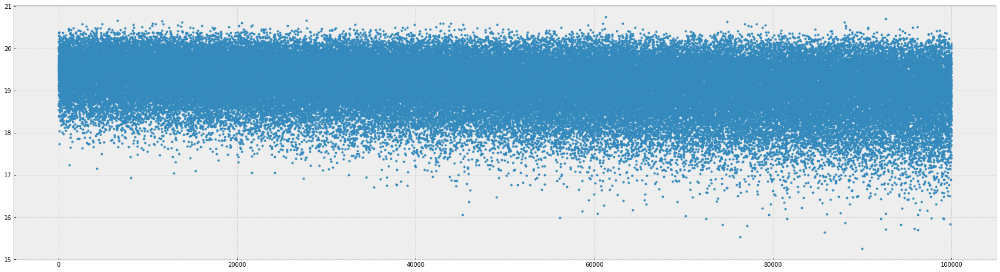

In [510]:
plt.figure(figsize=(30,8))
plt.plot(y,'.')

y mean: 19.411118477859056
default performance: (0.8980582524271845, 0.9438775510204082, 0.9203980099502488, None)


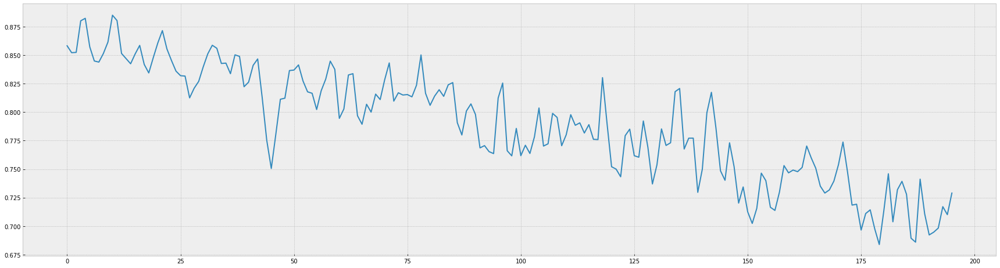

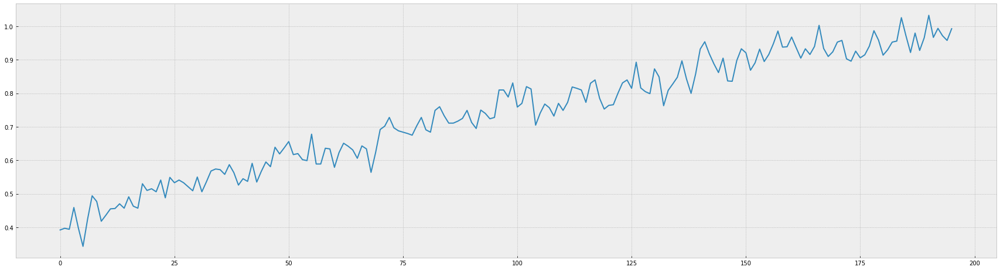

In [511]:
mn = np.mean(y[0:1000])
print("y mean:",mn)
dataset['y'] = [1 if i > mn else 0 for i in y]


trainset = dataset[0:1000].drop(columns=['y']).values
train_y = dataset[0:1000]['y'].values
business_model = RandomForestClassifier(n_estimators=80,max_depth=5)
business_model.fit(trainset,train_y)
testset = dataset[1000:1400].drop(columns=['y']).values
test_y = dataset[1000:1400]['y'].values

base_score = precision_recall_fscore_support(test_y, business_model.predict(testset),average='binary')

print("default performance:",base_score)

X2 = dataset[1400:].drop(columns=['y']).values
Y2 = dataset[1400:]['y'].values

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    f1 = precision_recall_fscore_support(uy, business_model.predict(ux),average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))

result_df = pd.DataFrame(result)
result_df['precision'].plot(figsize=(30,8))
plt.show()
result_df['drift'].plot(figsize=(30,8))
plt.show()

In [512]:

result = {}
result['precision'] = []
result['predicted'] = []
result['drift'] = []

drifts = {}
for f in range(10):
    drifts[f'x{f}'] = []
#MI
mi_scores = make_mi_scores(pd.DataFrame(trainset,columns=COLUMNS), train_y, discrete_features="auto")
imp_df_mi = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
print(imp_df_mi)

imp_df_mi2 = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
window_size = 1000
step = 500
predicted = 0
batch = math.ceil((X2.shape[0]-window_size)/step)
for i in range(batch):
    ux = X2[i*step:i*step+window_size]
    uy = Y2[i*step:i*step+window_size]
    y_ = business_model.predict(ux)
    f1 = precision_recall_fscore_support(uy,y_ ,average='binary')
    drift = __ks_drift(trainset,ux)
    result['precision'].append(f1[0])
    result['predicted'].append(0.0)
    result['drift'].append(sum(abs(drift[:,0])))
    for idx, dv in enumerate(drift[:,0]):
        drifts[f'x{idx}'].append(dv)

    #MI
    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), uy, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi.loc[len(imp_df_mi)] = tmp_df.values.reshape(-1,)

    mi_scores = make_mi_scores(pd.DataFrame(ux,columns=COLUMNS), y_, discrete_features="auto")
    tmp_df = pd.DataFrame(mi_scores.values.reshape(1,-1),columns=list(mi_scores.keys()))[COLUMNS]
    imp_df_mi2.loc[len(imp_df_mi2)] = tmp_df.values.reshape(-1,)

    print(f"\r{i+1}/{batch} f1:{f1[0]:.4f}", end="", flush=True)

        x0        x1        x2        x3   x4        x5        x6   x7  \
0  0.13275  0.110939  0.033432  0.043636  0.0  0.026247  0.029931  0.0   

         x8   x9  
0  0.000892  0.0  
196/196 f1:0.7290

[]

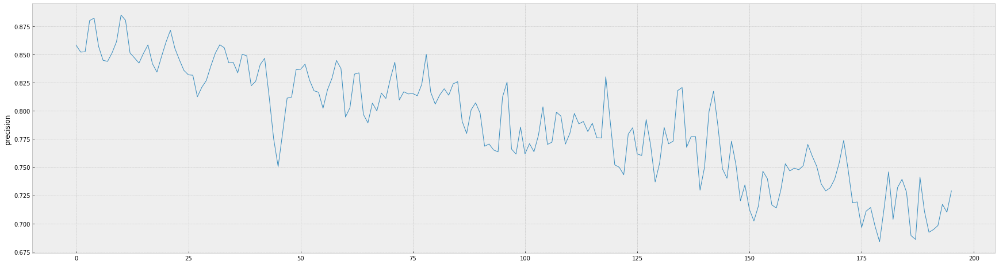

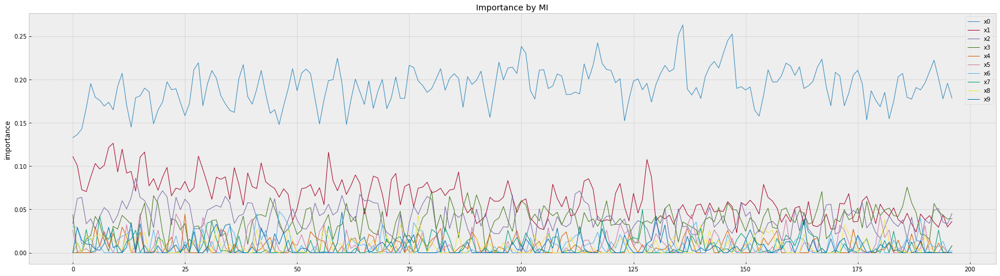

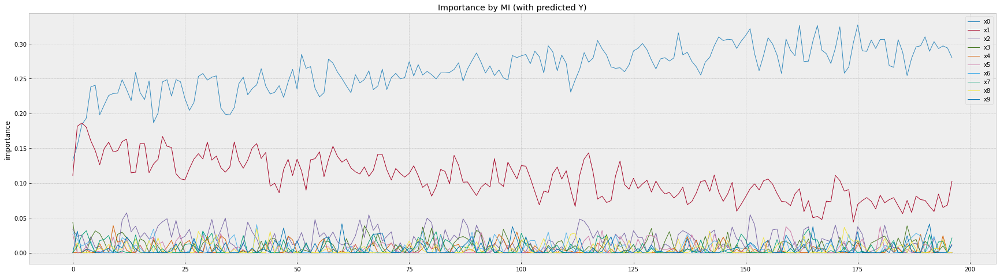

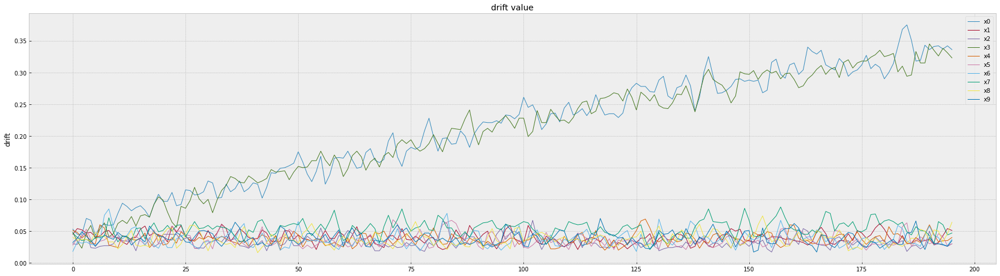

In [513]:
plt.style.use('bmh')

result_df = pd.DataFrame(result)
result_df['precision'].plot(ylabel='precision',linewidth=1,figsize=(30,8))

ax = imp_df_mi.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

ax = imp_df_mi2.plot(ylabel='importance',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("Importance by MI (with predicted Y)",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

tmp_df = pd.DataFrame(drifts)

ax = tmp_df.plot(ylabel='drift',linewidth=1,figsize=(30,8),legend=True)
ax.set_title("drift value",color='black')
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()
